In [43]:
using Pkg
Pkg.instantiate()

In [44]:
using Revise, CairoMakie
using ColonyImages
using DataFrames, CSV, FileIO, Dates
import ColorSchemes as co 


# 1.Create Eden Model schematic

### 1.1 Set Parameters

In [45]:
para = parameters()

parameters
  time_points: Array{Float64}((4,)) [0.0, 48.0, 96.0, 144.0]
  threshold_conv: Float64 0.8
  threshold_c: Float64 0.8
  kernel_ratio: Float64 0.4
  steps_angular: Int64 360
  samples_pair: Int64 2000000
  timesteps: Int64 300
  im_size: Array{Int64}((2,)) [600, 600]
  stacks: Int64 4
  radius_colony: Int64 30
  Center: Array{Int64}((2,)) [300, 300]
  growth_rate: Float64 0.02971700864000873
  colony_size: #2 (function of type ColonyImages.var"#2#8"{Float64})
  relative_size_filles_holes: Float64 0.01
  laplac_kernel: Array{Int64}((3, 3)) [0 1 0; 1 -4 1; 0 1 0]
  colony_nr: Int64 4
  colonies: Array{String}((4,))
  plot_factor: Float64 2.0
  Points: Array{Vector{Vector{Int64}}}((298,))
  col_size_add: Array{Float64}((4,)) [0.0, 3.078106341556083, 15.630951333039935, 66.82278809738074]
  col_size_add_diff: Array{Float64}((3,)) [3.078106341556083, 12.552844991483852, 51.191836764340806]
  number_finger: Int64 15
  finger_dist: Float64 0.1


### 1.2 Create spherical  starting colony 

In [46]:
colony  =BitArray(zeros(Bool, para.im_size...,para.stacks))
build_artifical_colony!(para.Center,(@view colony[:,:,1]),para.radius_colony,para.Points)
pixel_to_add = round.(Int,sum(colony[:,:,1]).*(para.col_size_add_diff))

3-element Vector{Int64}:
   9225
  37621
 153422

### 1.3 Randomly expand spherical starting colony 

In [47]:
for j in 2:para.stacks
    # use view to work on array directly 
    int_img  = @view colony[:,:,j]
    #assign previous colony to current colony
    int_img[:] = colony[:,:,j-1]
    expand_colony_radom_cov!(int_img,pixel_to_add[j-1])
end


### 1.4 Make Plot

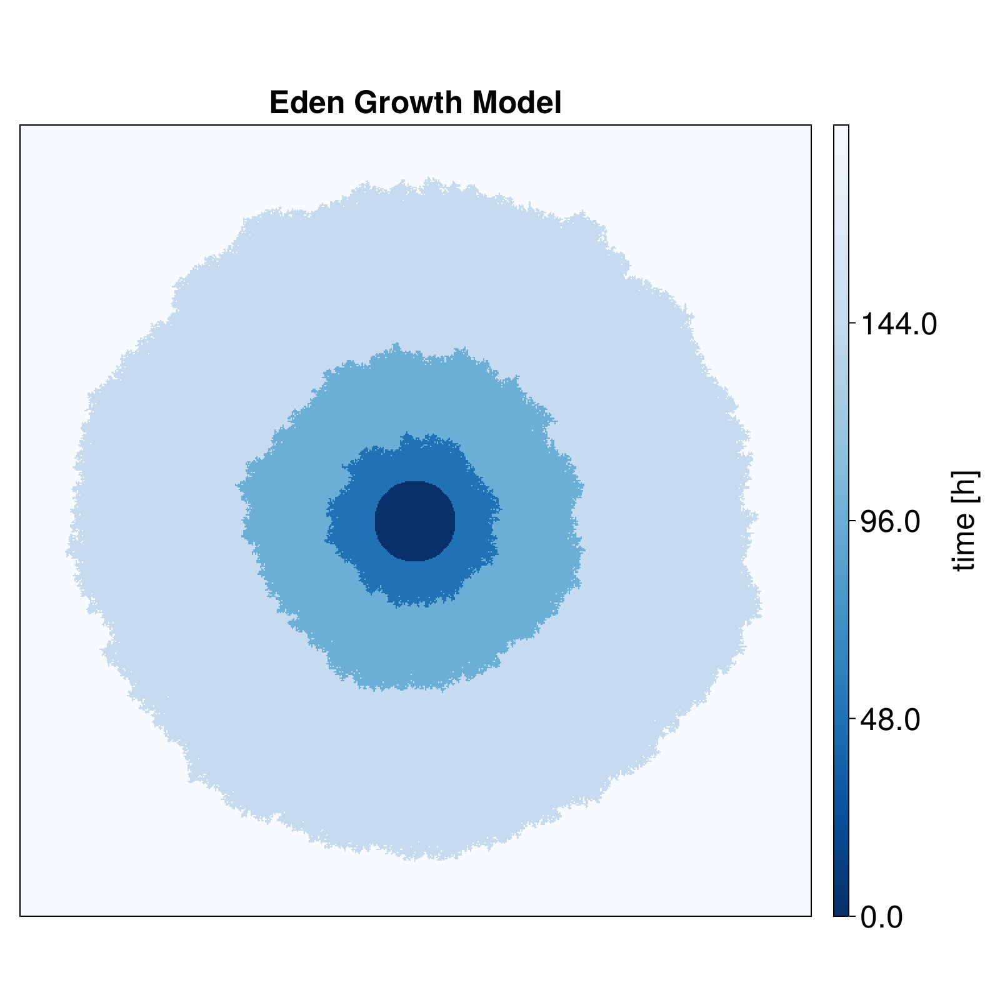

In [48]:
blue_rev = reverse(co.Blues)
fontsize_theme = Theme(fontsize = 25)
update_theme!(fontsize_theme)

fig_eden = Figure(size= (800, 800))
ax = Axis(fig_eden[1,1],aspect = DataAspect(),title = "Eden Growth Model")
int_img = zeros(Int,para.im_size...)
for z in 1:size(colony,3)
    int_img += colony[:,:,z]
end 
heaty = heatmap!(ax,(int_img .-(maximum(int_img))) .*-1 , colormap = blue_rev)
hidedecorations!(ax)
Colorbar(fig_eden[1,2], heaty ,ticks = (0:(length(para.time_points)-1),string.(para.time_points)), label = "time [h]",tellheight=true)
rowsize!(fig_eden.layout, 1, Aspect(1, 1))

save("plots/eden_growth_model.pdf",fig_eden)
fig_eden

# 2. Make convolution Schematic

### 2.1 Create empty colony

In [49]:
para = parameters(
    time_points = Float64[0,24,48,72,96,120],
    im_size = [10,10],   
)

parameters
  time_points: Array{Float64}((6,)) [0.0, 24.0, 48.0, 72.0, 96.0, 120.0]
  threshold_conv: Float64 0.8
  threshold_c: Float64 0.8
  kernel_ratio: Float64 0.4
  steps_angular: Int64 360
  samples_pair: Int64 2000000
  timesteps: Int64 300
  im_size: Array{Int64}((2,)) [10, 10]
  stacks: Int64 6
  radius_colony: Int64 0
  Center: Array{Int64}((2,)) [5, 5]
  growth_rate: Float64 0.02971700864000873
  colony_size: #4 (function of type ColonyImages.var"#4#10"{Float64})
  relative_size_filles_holes: Float64 0.01
  laplac_kernel: Array{Int64}((3, 3)) [0 1 0; 1 -4 1; 0 1 0]
  colony_nr: Int64 4
  colonies: Array{String}((4,))
  plot_factor: Float64 2.0
  Points: Array{Vector{Vector{Int64}}}((3,))
  col_size_add: Array{Float64}((6,)) [0.0, 1.0194321829554176, 3.078106341556083, 7.2354591916529305, 15.630951333039935, 32.58507835510615]
  col_size_add_diff: Array{Float64}((5,)) [1.0194321829554176, 2.0586741586006654, 4.1573528500968475, 8.395492141387004, 16.954127022066213]
  number

In [50]:
colony  =BitArray(zeros(Bool, para.im_size...,para.stacks))
colony_cov =zeros(Float64, para.im_size...,para.stacks)
build_artifical_colony!(para.Center,(@view colony[:,:,1]),para.radius_colony,para.Points)
pixel_to_add = round.(Int,sum(colony[:,:,1]).*(para.col_size_add_diff))

5-element Vector{Int64}:
  1
  2
  4
  8
 17

In [51]:
begin 
    @label loop_try_as_long_until_it_works
    try 
        for j in 2:para.stacks
            # use view to work on array directly 
            int_img  = @view colony[:,:,j]
            #assign previous colony to current colony
            int_img[:] = colony[:,:,j-1]
            colony_cov[:,:,j] = expand_colony_radom_cov_show!(int_img,pixel_to_add[j-1])
        end
    catch
        print("failed ")
        @goto loop_try_as_long_until_it_works
    end   
end

failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed failed 

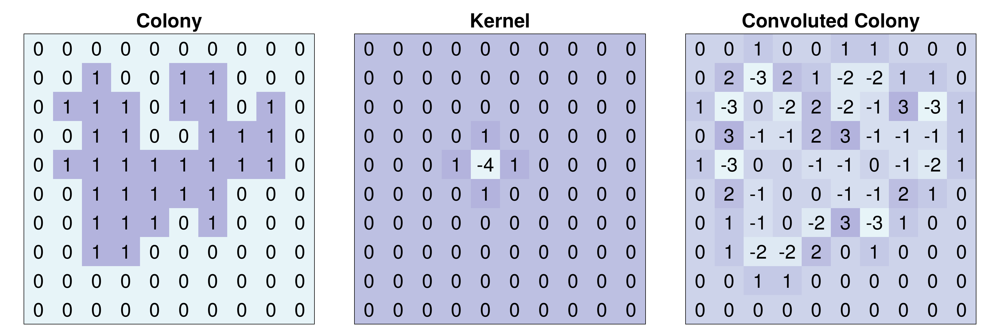

In [52]:
plot_convolution_schematic3(colony, colony_cov, para)

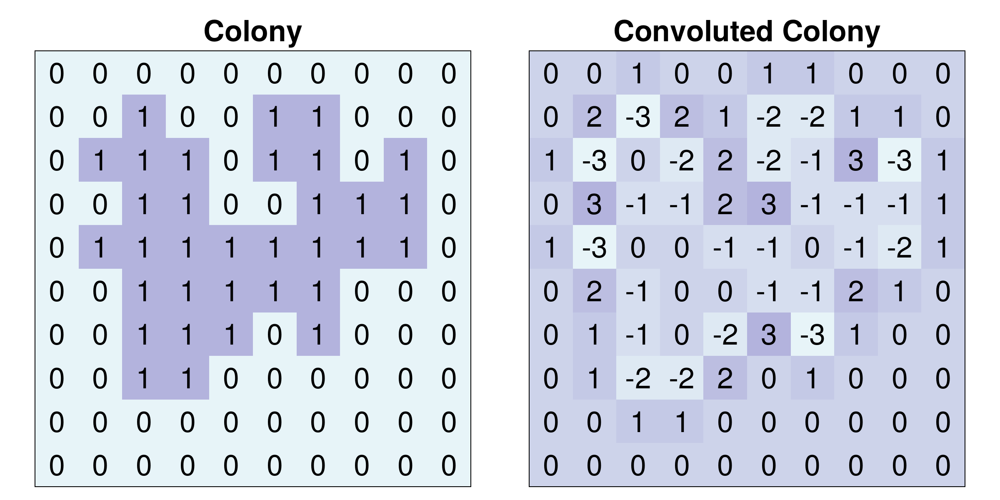

In [53]:
plot_convolution_schematic2(colony, colony_cov, para, name = "cov_fig1")

In [54]:
border_points = (findall(colony_cov[:,:,end] .> 0.1))
for i in 1:length(border_points)
    println(i, " ", border_points[i])
end

1 CartesianIndex(3, 2)
2 CartesianIndex(4, 2)
3 CartesianIndex(2, 3)
4 CartesianIndex(5, 3)
5 CartesianIndex(7, 3)
6 CartesianIndex(2, 4)
7 CartesianIndex(6, 4)
8 CartesianIndex(8, 4)
9 CartesianIndex(2, 5)
10 CartesianIndex(8, 5)
11 CartesianIndex(9, 5)
12 CartesianIndex(1, 6)
13 CartesianIndex(10, 6)
14 CartesianIndex(2, 7)
15 CartesianIndex(5, 7)
16 CartesianIndex(6, 7)
17 CartesianIndex(10, 7)
18 CartesianIndex(1, 8)
19 CartesianIndex(5, 8)
20 CartesianIndex(8, 8)
21 CartesianIndex(10, 8)
22 CartesianIndex(2, 9)
23 CartesianIndex(4, 9)
24 CartesianIndex(5, 9)
25 CartesianIndex(8, 9)
26 CartesianIndex(9, 9)
27 CartesianIndex(3, 10)
28 CartesianIndex(6, 10)
29 CartesianIndex(7, 10)


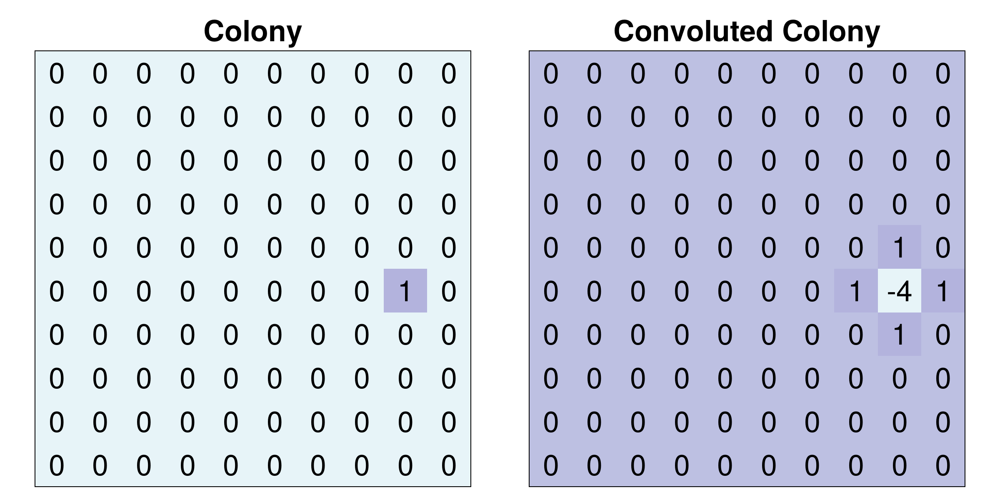

In [55]:
point = border_points[11]
expand_colony_point!(colony[:,:,end], colony_cov[:,:,end], point);

cov_add = zeros(Int, para.im_size...)
data_add = zeros(Int, para.im_size...)

cov_add[point[1]-1:point[1]+1,point[2]-1:point[2]+1] += para.laplac_kernel
data_add[point] += 1

plot_convolution_schematic2(data_add, cov_add, para, name ="added_point")

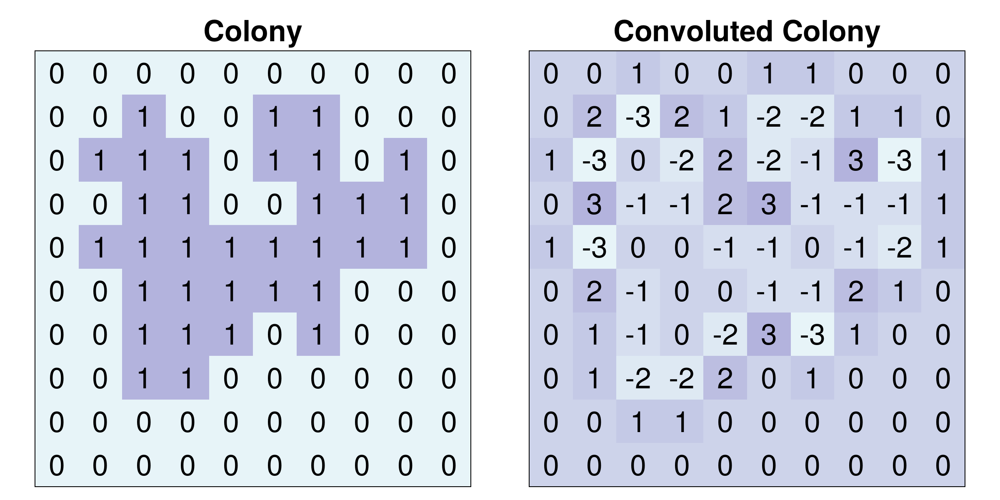

In [56]:
plot_convolution_schematic2(colony, colony_cov, para, name ="cov_fig2")

# 3. Show all colonies

In [57]:
para = parameters(
    time_points = Float64[0,24,48,72,96,120],
    im_size = [1000,1000],
    plot_factor = 2
)

parameters
  time_points: Array{Float64}((6,)) [0.0, 24.0, 48.0, 72.0, 96.0, 120.0]
  threshold_conv: Float64 0.8
  threshold_c: Float64 0.8
  kernel_ratio: Float64 0.4
  steps_angular: Int64 360
  samples_pair: Int64 2000000
  timesteps: Int64 300
  im_size: Array{Int64}((2,)) [1000, 1000]
  stacks: Int64 6
  radius_colony: Int64 50
  Center: Array{Int64}((2,)) [500, 500]
  growth_rate: Float64 0.02971700864000873
  colony_size: #4 (function of type ColonyImages.var"#4#10"{Float64})
  relative_size_filles_holes: Float64 0.01
  laplac_kernel: Array{Int64}((3, 3)) [0 1 0; 1 -4 1; 0 1 0]
  colony_nr: Int64 4
  colonies: Array{String}((4,))
  plot_factor: Float64 2.0
  Points: Array{Vector{Vector{Int64}}}((498,))
  col_size_add: Array{Float64}((6,)) [0.0, 1.0194321829554176, 3.078106341556083, 7.2354591916529305, 15.630951333039935, 32.58507835510615]
  col_size_add_diff: Array{Float64}((5,)) [1.0194321829554176, 2.0586741586006654, 4.1573528500968475, 8.395492141387004, 16.95412702206621

In [58]:
img_int_vec_2 = Vector{BitArray{3}}(undef, 0)
for i in 1:para.colony_nr
    hans =zeros(Bool, para.im_size...,para.stacks);
    hans = BitArray(hans)
    push!(img_int_vec_2, hans)
end

In [59]:
for (i,colony) in enumerate(img_int_vec_2)
    for (j,t) in enumerate(para.time_points)
        # use view to work on array directly 
        int_img  = @view colony[:,:,j]
        if j == 1
            build_artifical_colony!(para.Center,int_img,para.radius_colony,para.Points)
            pixel_to_add = round.(Int,sum(img_int_vec_2[1][:,:,1]).*(para.col_size_add_diff))
        else
            # for unkown reason views require [:] to make assignments 
            int_img[:] = colony[:,:,j-1]
            expand_colony_radom_cov!(int_img,pixel_to_add[j-1])
        end
    end   
end

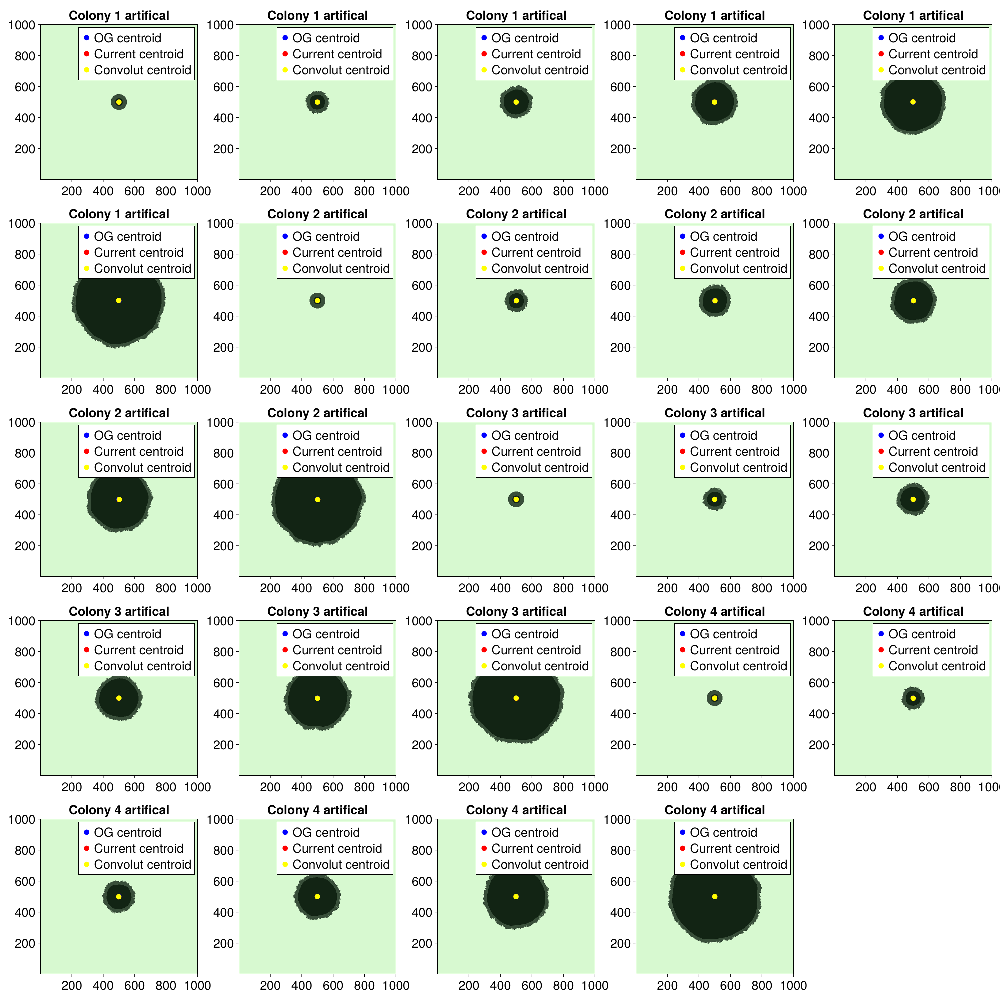

In [60]:
fontsize_theme = Theme(fontsize = 25)
update_theme!(fontsize_theme)
fig_big = plot_time_series_cov_centroid(img_int_vec_2, para)
fig_big

In [61]:
para = parameters(
    time_points = Float64[0,24,48,72,96,120],
    im_size = [1000,1000],
    plot_factor = 2
);
fontsize_theme = Theme(fontsize = 15)
update_theme!(fontsize_theme)

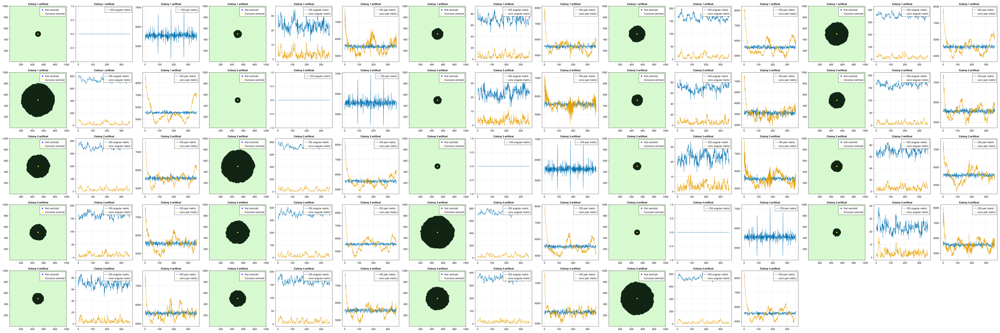

In [62]:
fig_metric = plot_time_series_metrics(img_int_vec_2, para)

In [76]:
para = parameters(
    time_points = Float64[0,24,48],
    im_size = [1600,1600],
    plot_factor = 2
)

colony  =BitArray(zeros(Bool, para.im_size...,para.stacks))
build_artifical_colony!(para.Center,(@view colony[:,:,1]),para.radius_colony,para.Points)
pixel_to_add = round.(Int,sum(colony[:,:,1]).*(para.col_size_add_diff))
grey_rev = reverse(co.grayC10)


for j in 2:para.stacks
    # use view to work on array directly 
    int_img  = @view colony[:,:,j]
    #assign previous colony to current colony
    int_img[:] = colony[:,:,j-1]
    expand_colony_radom_cov!(int_img,pixel_to_add[j-1])
end


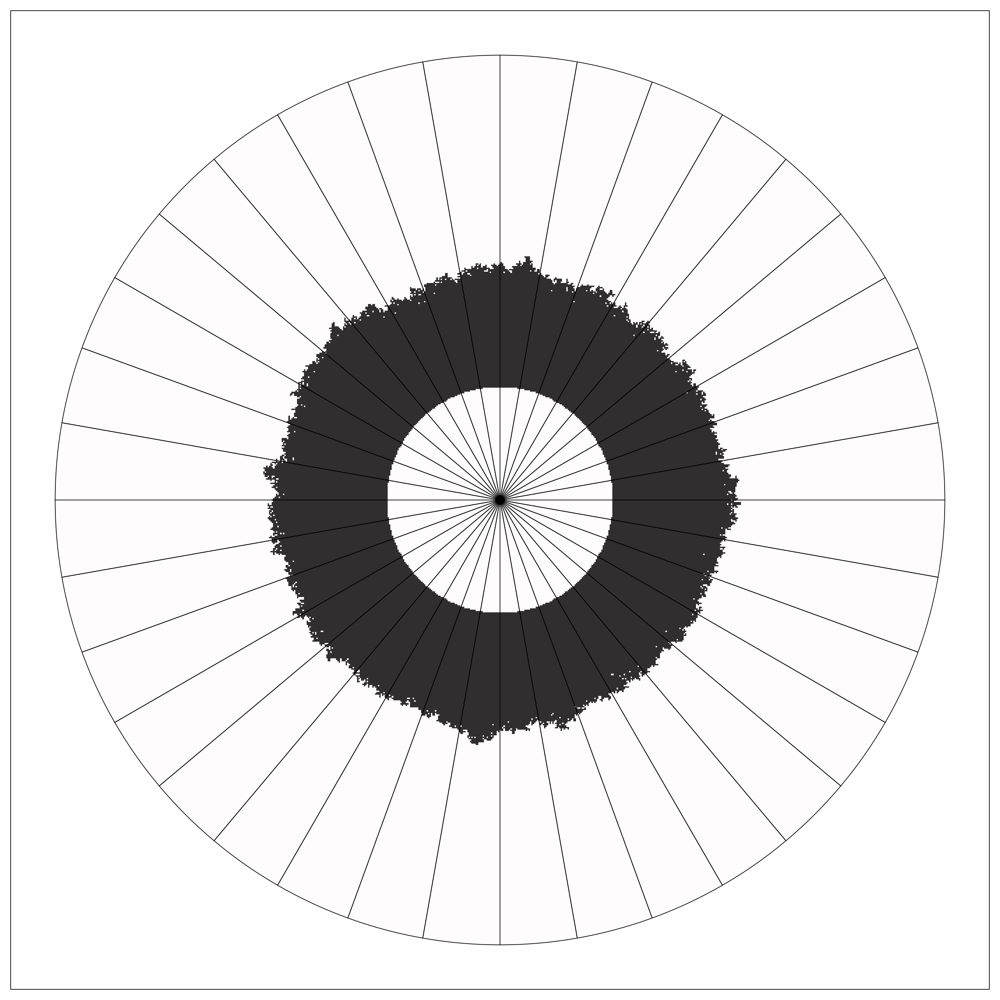

In [77]:
plot_metric_schematic(colony, para,grey_rev, name = "rand_expand")

In [78]:
grey_rev = reverse(co.grayC10)
for j in 2:para.stacks
    # use view to work on array directly 
    int_img  = @view colony[:,:,j]
    #assign previous colony to current colony
    int_img[:] = colony[:,:,j-1]
    expand_colony_finger_radom_cov!(int_img,pixel_to_add[j-1], generate_dir_vec(para))
end

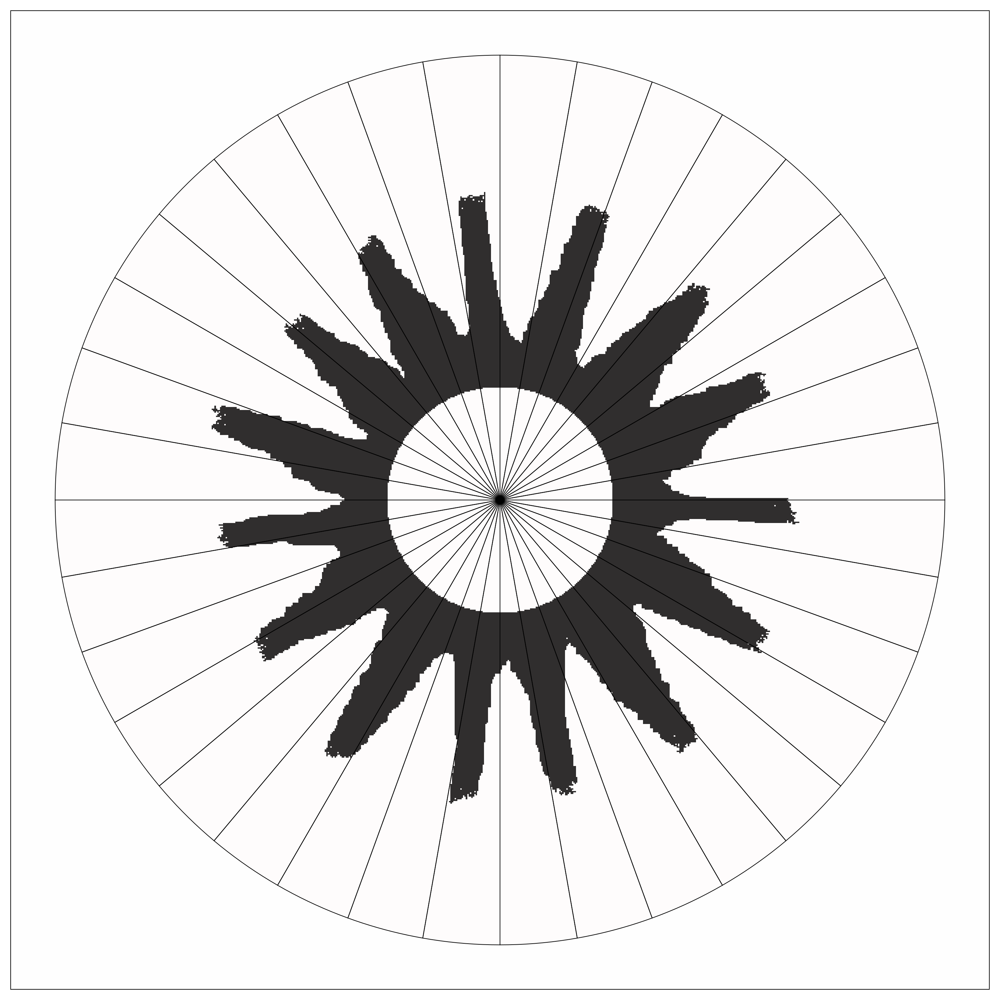

In [79]:
plot_metric_schematic(colony, para,grey_rev, name = "finger_expand")

In [80]:
grey_rev = reverse(co.grayC10)
for j in 2:para.stacks
    # use view to work on array directly 
    int_img  = @view colony[:,:,j]
    #assign previous colony to current colony
    int_img[:] = colony[:,:,j-1]
    expand_colony_finger_radom_cov!(int_img,pixel_to_add[j-1], generate_dir_vec(para),still_spawn_rate = 0.0)
end

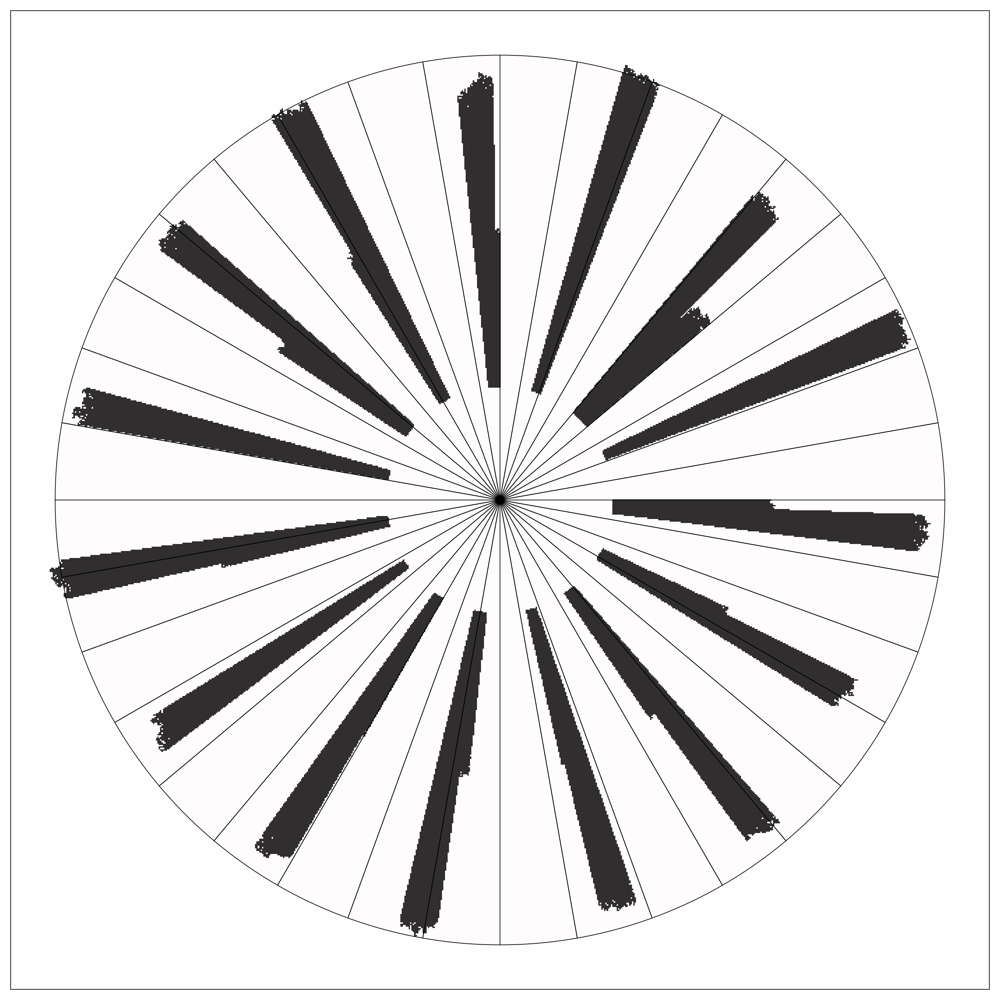

In [81]:
plot_metric_schematic(colony, para,grey_rev, name = "finger_expand")

In [82]:
?expand_colony_finger_radom_cov!

search: expand_colony_finger_radom_cov!



```
expand_colony_finger_radom_cov!(img::AbstractArray, pixels_to_add::Int, dir::Vector{Int}; dir_match_rate::AbstractFloat = 0.999, still_spawn_rate::AbstractFloat = 0.99, min_neigbour::Int = 2)
```

Expand the colony in the image `img` by adding `pixels_to_add` pixels. The expansion is done randomly  at the border of the colony, but it is more likely to expand in the direction specified by `dir`.  The border is determined by convolving the image with a Laplacian kernel and finding points where the convolution  is greater than 0.1. The function modifies the input image in-place.

# Arguments

  * `img::AbstractArray`: A 2D array representing the image of the colony. The colony is represented by 1s and the background by 0s.
  * `pixels_to_add::Int`: The number of pixels to add to the colony.
  * `dir::Vector{Int}`: A vector representing the preferred direction of expansion.
  * `dir_match_rate::AbstractFloat`: A float representing the threshold for the dot product between the preferred direction and the point. Default is 0.999.
  * `still_spawn_rate::AbstractFloat`: A float representing the probability of expanding in a direction opposite to `dir`. Default is 0.99.
  * `min_neigbour::Int`: The minimum number of neighboring points that must be occupied for a point to be added to the colony. Default is 2.

# Example

```julia
img = zeros(100, 100)
img[50:55, 50:55] .= 1
expand_colony_finger_radom_cov!(img, 100, [1, 0])
```
